# **Avance 4. Modelos alternativos**

Objetivos:

- 3.3 Explorar una gama diversa de técnicas y enfoques con el fin de identificar el de mejor desempeño en el conjunto de datos en cuestión.

- 3.4 Encontrar la configuración óptima que maximiza el rendimiento del modelo en una tarea específica.



###**Equipo 25**


### Estudiantes


* A01793899 - Andrés Julián López Hurtado
* A01793999 - Nathalia Milena Prada Hernández
* A01794404 - Victor Alejandro Regueira Romero

Fecha: 6 de octubre de 2024

# Instrucciones

Este avance implica construir múltiples modelos (individuales, no ensambles) relevantes para resolver el problema y evaluar su desempeño. Diferentes algoritmos pueden comportarse de manera óptima en diferentes tipos de datos o tareas. La construcción de modelos alternativos permite explorar y evaluar cuál de ellos proporciona el mejor rendimiento para un problema particular.

Además, los modelos se pueden ajustar para determinar si se puede mejorar su rendimiento. Diferentes configuraciones de hiperparámetros pueden afectar significativamente el rendimiento de un modelo. Construir modelos alternativos implica explorar y ajustar estos hiperparámetros para encontrar la configuración óptima.

Las siguientes son acciones que deberás abordar en este avance:

* Construir al menos 6 modelos diferentes (individuales, no ensambles), utilizando algoritmos variados.
* Comparar el rendimiento de los modelos obtenidos.
* Seleccionar los dos modelos que proporcionen el mejor rendimiento.
* Ajustar los dos mejores modelos.
* Elegir el modelo individual final.

# Importar Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Librerías

In [ ]:
#Importando las librerías que necesitamos

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pydotplus
import seaborn as sns   # para un mejor despliegue de los gráficos

#Esta libraría la voy a usar para hacer la división de datos en datos de entrenamiento y en datos de prueba.
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

#Las siguientes librerías las voy a usar para crear el pipeline.
from sklearn.pipeline import Pipeline #Esta para armar el pipeline
from sklearn.impute import SimpleImputer #Esta es para simple imputer, sirve para tratamiento de valores nan (missing values)
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler #Esta para hacer el escalado (numércias), onehotencoder (categóricas)
from sklearn.preprocessing import FunctionTransformer #Para variables cuantitativas. La uso en el Pipeline
from sklearn.utils import class_weight
from sklearn.compose import ColumnTransformer #Esta es ya para armar todo el arreglo con las imputaciones, transformaciones y demás del preprocesamiento.

#Las siguientes librerías son los modelos que voy a entrenar y el método de validación cruzada k-fold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree  # para el grafico de arbol de decision
from IPython.display import Image

from sklearn.model_selection import RepeatedStratifiedKFold #Método de validación cruzada k-fold
from sklearn.model_selection import cross_validate #Esta función me permite pegar todo lo que se crea: el pipeline, los modelos a entrenar y
                                                    #las métricas que he creado para medición del desempeño.

from sklearn.model_selection import cross_val_score


from sklearn.metrics import classification_report, make_scorer #El método maske_scorer me va a permitir crear un diccionario para juntar todas las
                                                               #métricas de desempeño que se van a definir
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import learning_curve, validation_curve #Para calcular las curvas de entrenamiento.
from sklearn.model_selection import GridSearchCV #Para calcular el mejor conjunto de hiperparámetros



# Rutas de archivos y carga de la base

In [ ]:
file_tabla_inicial = '/content/drive/MyDrive/TECForza/df_union2.csv'
df_tabla_inicial= pd.read_csv(file_tabla_unida)

In [ ]:

columnas_no_modificar = ['name',  'date',  'total_distance_used_sum', 'total_fuel_used_sum', 'consumption',  'AverageSpeed',  'MaxSpeed']

columnas_clasificar = [ 'idlingPercent', 'SpeedLimit1Count', 'TotalStopsCount', 'SpeedingDistance',
                       'ExcessiveSpeedingDuration', 'ExcessiveSpeedingCount', 'HardAccelerationCount',
                        'HarshBrakingCount', 'HarshCorneringCount']


columnas_omitir = ['performance', 'distance', 'idlingDuration',
                   'idlingDuration_hours', 'CurrentFuelPrice', 'IdlingCost', 'SpeedLimit2Count',
                    'SpeedLimit3Count', 'TotalDrivingDuration', 'StopUnder10Count', 'StopOver10Count',
                    'StopOver20Count', 'StopOver30Count', 'StopOver40Count', 'StopOver50Count',
                    'IdlingOver5Count', 'IdlingDuration', 'AfterHoursTripCount', 'TotalDistance',
                    'SpeedingDuration', 'SpeedingCount', 'ExcessiveSpeedingDistance', 'HardAccelerationDistance',
                    'HarshBrakingDistance', 'HarshCorneringDuration', 'HarshCorneringDistance']

In [ ]:
#Ahora voy a crear una función para clasificar los elementos en S, M, L y XL


def clasificador(df, columna):
    # Ordenamos la columna sin alterar el índice para mantener el orden original
    sorted_column = df[columna].sort_values().values

    # Dividimos los datos en 4 grupos equitativos (S, M, L, XL)
    n = len(sorted_column) // 4  # número de elementos por grupo
    remainder = len(sorted_column) % 4  # para manejar si no es divisible exactamente

    # Creamos una lista con los grupos
    labels = ["S"] * n + ["M"] * n + ["L"] * n + ["XL"] * n
    extra_labels = ["S", "M", "L", "XL"]

    # Distribuimos el resto de elementos en los grupos
    for i in range(remainder):
        labels.append(extra_labels[i])

    # Reordenamos los grupos en el orden original de los datos
    sorted_df = pd.Series(labels, index=df[columna].sort_values().index)
    clasificada_columna = sorted_df.loc[df.index]  # para mantener el orden original

    # Creamos el nuevo nombre de la columna
    nuevo_nombre = f"mod_{columna}"

    return clasificada_columna, nuevo_nombre


Voy a crear ahora la tabla unida sólo con las variables que me interesa (columnas_no_modificar y columnas_clasificar). En esta columna ya voy a meter sólo los datos clasificados.

In [ ]:

# Primero creo el dataframe vacío. En este caso, lo inicializamos con las columnas sin modificar.
df_tabla_unida = df_tabla_inicial[columnas_no_modificar].copy()  # Hacemos una copia explícita

# Recorremos las columnas que están en columnas_clasificar
for columna in columnas_clasificar:
    if columna in df_tabla_inicial.columns:
        # Añadir la columna original
        df_tabla_unida.loc[:, columna] = df_tabla_inicial.loc[:, columna]

        # Clasificar la columna y obtener la nueva columna clasificada
        df_tabla_unida.loc[:, f"mod_{columna}"], _ = clasificador(df_tabla_inicial, columna)


#Creo esta tabla de back up sólo por si acaso.
df_tabla_unida_backuo = df_tabla_unida.copy()

Finalmebnte dejo df_tabla_unida lista con las clasificaciones.

In [ ]:
# Eliminar las columnas que están en columnas_clasificar del dataframe df_tabla_unida
df_tabla_unida = df_tabla_unida.drop(columns=columnas_clasificar)

# Verificamos las primeras filas del dataframe resultante
df_tabla_unida.head()


,name,date,total_distance_used_sum,total_fuel_used_sum,consumption,AverageSpeed,MaxSpeed,mod_idlingPercent,mod_SpeedLimit1Count,mod_TotalStopsCount,mod_SpeedingDistance,mod_ExcessiveSpeedingDuration,mod_ExcessiveSpeedingCount,mod_HardAccelerationCount,mod_HarshBrakingCount,mod_HarshCorneringCount
0,986,2024-07-01,115.575006,15.321976,7.543088,55.20,83.885109,XL,L,L,L,L,L,XL,XL,L
1,1038,2024-07-01,167.770170,25.096340,6.685045,54.70,76.428658,XL,S,M,S,S,S,S,M,M
2,502,2024-07-02,1025.262150,68.948892,8.653096,27.85,42.874611,L,M,S,M,L,L,L,XL,L
3,532,2024-07-02,1103.554896,75.817364,14.555437,53.50,38.835701,M,S,M,S,S,S,XL,M,M
4,880,2024-07-02,857.491980,64.193796,13.357864,58.90,83.885109,XL,XL,S,XL,XL,XL,L,M,L


#Moldelo 1: Árbol de decisión mejorado

Primero, voy a separar la base de datos en X y Y. Y será sólo la columna "Consumption" y X todo lo demás. Luego haré algunos arreglos a cada una de las tablas.

In [ ]:
# Separar en X e Y
X = df_tabla_unida.drop(columns=['consumption'])  # X es todo menos la columna 'consumption'
Y = df_tabla_unida['consumption']  # Y es solo la columna 'consumption'

# Mostrar las primeras filas de X e Y
#print(X.head())


##Ajustes de la variable de entrada X
Voy a retirar ahora las columnas name y date.

In [ ]:

lista_quitar = ['name', 'date']


In [ ]:
X_modificada = X.drop(columns=lista_quitar)

In [ ]:
ruta_guardado = '/content/drive/MyDrive/TECForza/X_modificada.csv'
X_modificada.to_csv(ruta_guardado, index=False)

Ahora vamos a analizar las distribuciones de las variables para saber qué tipo de transformación utilizar. Al parecer una que funciona bien es raiz cúbica. Las variables numéricas quedaron solamente tres: total_distance_used_sum, AverageSpeed, MaxSpeed.

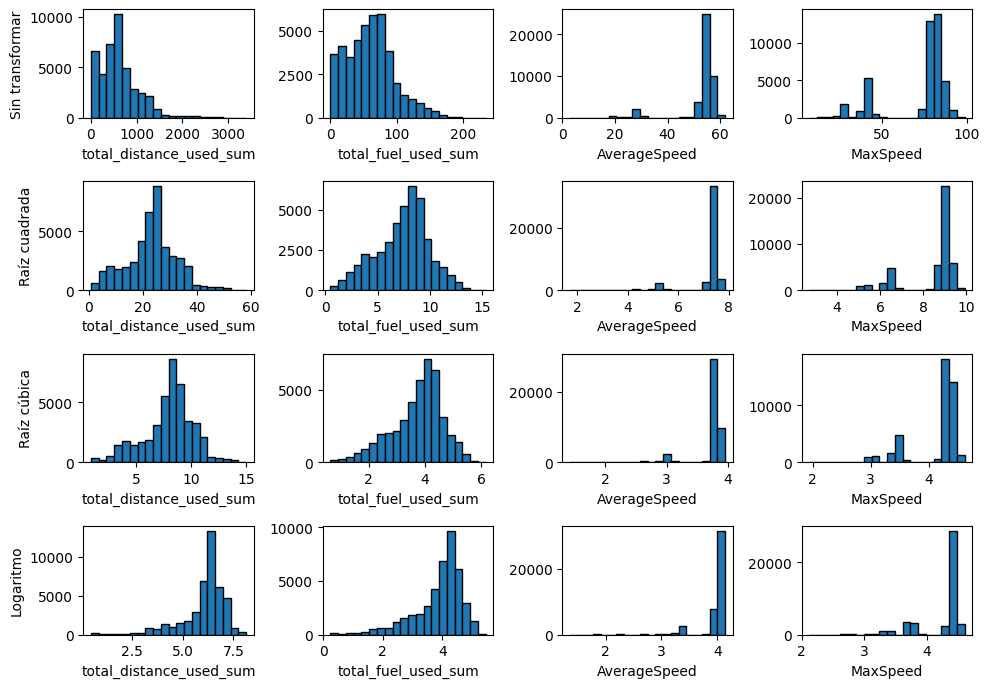

In [ ]:


# Filtrar solo las columnas numéricas de X_modificada
df_numeric = X_modificada.select_dtypes(include=[np.number])

plt.figure(figsize=(10, 7))


# Define the number of rows and columns for the subplots
num_rows = 4  # One row for each transformation type
num_cols = 4  # One column for each of the 5 features


# Iterar sobre las primeras 4 columnas numéricas para realizar las transformaciones
for k in range(0, 4):
    plt.subplot(num_rows, num_cols, k + 1)
    plt.hist(df_numeric[df_numeric.columns[k]], bins=20, edgecolor='black')
    plt.xlabel(df_numeric.columns[k])
    if k == 0:
        plt.ylabel("Sin transformar")

    plt.subplot(num_rows, num_cols, k + 1+ num_cols)
    plt.hist(np.sqrt(df_numeric[df_numeric.columns[k]]), bins=20, edgecolor='black')
    plt.xlabel(df_numeric.columns[k])
    if k == 0:
        plt.ylabel("Raíz cuadrada")

    plt.subplot(num_rows, num_cols, k + 1 + 2 * num_cols)
    plt.hist(np.cbrt(df_numeric[df_numeric.columns[k]]), bins=20, edgecolor='black')
    plt.xlabel(df_numeric.columns[k])
    if k == 0:
        plt.ylabel("Raíz cúbica")

    plt.subplot(num_rows, num_cols, k + 1 + 3 * num_cols)
    plt.hist(np.log(df_numeric[df_numeric.columns[k]] + 1), bins=20, edgecolor='black')  # Sumar 1 para evitar log(0)
    plt.xlabel(df_numeric.columns[k])
    if k == 0:
        plt.ylabel("Logaritmo")

plt.tight_layout()
plt.show()


Estos son los histogramas de todas las variables luego que pasan por la transformación raíz cúbica.

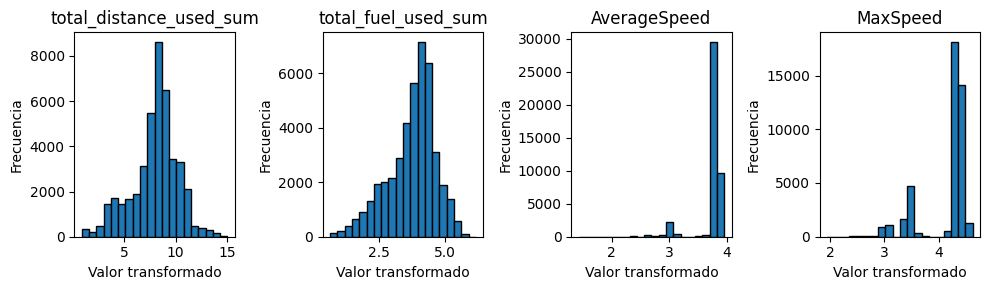

In [ ]:


# Filtrar solo las columnas numéricas de X_modificada
df_numeric = X_modificada.select_dtypes(include=[np.number])

# Crear un grid de 3x1 (6 filas y 7 columnas)
fig, axes = plt.subplots(1, 4, figsize=(10, 3))  # Ajustar el tamaño de la figura

# Flatten la matriz de axes para iterar sobre ella más fácilmente
axes = axes.flatten()

# Iterar sobre todas las columnas numéricas y aplicar la transformación cúbica
for i, columna in enumerate(df_numeric.columns):
    # Transformar la columna con raíz cúbica
    transformed_data = np.cbrt(df_numeric[columna])

    # Crear histograma en cada subplot correspondiente
    axes[i].hist(transformed_data, bins=20, edgecolor='black')
    axes[i].set_title(columna)
    axes[i].set_xlabel('Valor transformado')
    axes[i].set_ylabel('Frecuencia')

# Ajustar los espacios entre subplots para evitar la superposición
plt.tight_layout()
plt.show()


##Ajustes de la variable de salida Y, consumption

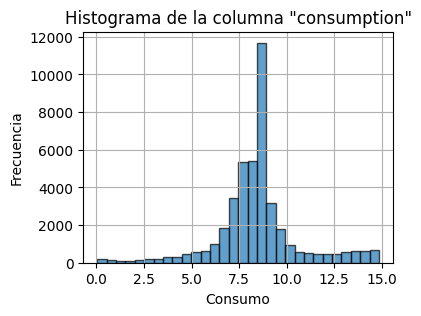

In [ ]:
import matplotlib.pyplot as plt

# Crear el histograma de Y (columna 'consumption')
plt.figure(figsize=(4, 3))
plt.hist(Y, bins=30, edgecolor='black', alpha=0.7)
plt.title('Histograma de la columna "consumption"')
plt.xlabel('Consumo')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


Voy a crear cuatro grupos dependiendo del valor de consumption: S, M, L y XL. Esto para poder crear una variable discreta para el árbol de decisión de tipo clasificación. Los valores umbrales se escogieron para que la cantidad de elementos en cada grupo sea aproximadamente igual y no se cree un problema de desbalaceo en los datos de Y. Los umblares son:

* Grupo S: Rango (0.0392, 7.5566) - Cantidad: 10,759
* Grupo M: Rango (7.5566, 8.5477) - Cantidad: 10,758
* Grupo L: Rango (8.5477, 8.9567) - Cantidad: 10,759
* Grupo XL: Rango (8.9567, 14.8651) - Cantidad: 10,757

Aplicamos los cuantiles para crear una Y_modificada


In [ ]:
# Dividir los datos de Y en 4 grupos de igual tamaño
quantiles = Y.quantile([0.25, 0.5, 0.75])

# Definir los rangos para cada grupo
rango_S = (Y.min()-0.01, quantiles[0.25])
rango_M = (quantiles[0.25], quantiles[0.5])
rango_L = (quantiles[0.5], quantiles[0.75])
rango_XL = (quantiles[0.75], Y.max())

# Contar cuántos datos quedan en cada grupo
grupo_S = Y[(Y >= rango_S[0]) & (Y <= rango_S[1])].count()
grupo_M = Y[(Y > rango_M[0]) & (Y <= rango_M[1])].count()
grupo_L = Y[(Y > rango_L[0]) & (Y <= rango_L[1])].count()
grupo_XL = Y[(Y > rango_XL[0]) & (Y <= rango_XL[1])].count()

# Mostrar los resultados
rangos = {
    "S": {"rango": rango_S, "cantidad": grupo_S},
    "M": {"rango": rango_M, "cantidad": grupo_M},
    "L": {"rango": rango_L, "cantidad": grupo_L},
    "XL": {"rango": rango_XL, "cantidad": grupo_XL}
}



# Crear la variable Y_modificada asignando letras según las reglas de los grupos
Y_modificada = pd.cut(Y,
                      bins=[Y.min()-0.01, quantiles[0.25], quantiles[0.5], quantiles[0.75], Y.max()],
                      labels=['S', 'M', 'L', 'XL'])

# Mostrar las primeras filas de Y_modificada para verificar
print(Y_modificada.head())




0     S
1     S
2     L
3    XL
4    XL
Name: consumption, dtype: category
Categories (4, object): ['S' < 'M' < 'L' < 'XL']


El histograma de Y_modificada y Y quedaría así:

Text(0, 0.5, 'Frecuencia')

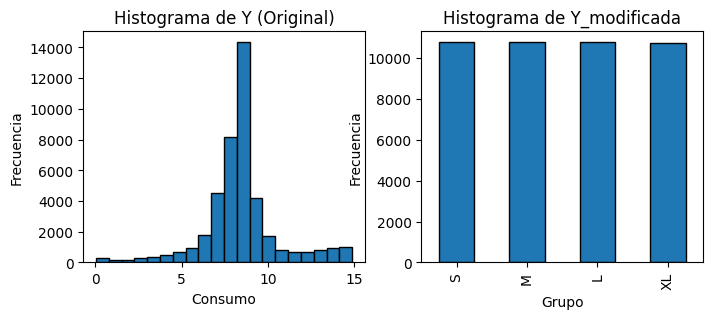

In [ ]:
# Crear un grid de 1 fila y 2 columnas para los histogramas de Y y Y_modificada
fig, axes = plt.subplots(1, 2, figsize=(8, 3))

# Histograma de Y (variable original)
axes[0].hist(Y, bins=20, edgecolor='black')
axes[0].set_title('Histograma de Y (Original)')
axes[0].set_xlabel('Consumo')
axes[0].set_ylabel('Frecuencia')

# Histograma de Y_modificada (variable categorizada)
Y_modificada.value_counts().sort_index().plot(kind='bar', ax=axes[1], edgecolor='black')
axes[1].set_title('Histograma de Y_modificada')
axes[1].set_xlabel('Grupo')
axes[1].set_ylabel('Frecuencia')

Para mode

###Obtención de los conjuntos de validación y prueba

A continuación vamos a obtener los datos de validación y prueba. Vamos a pasar los datos de X_train, y posteriormente los de X_test, por un pipeline que prepare los datos de X así:
1. Un escalado de los datos
2. Aplicación de una transformación raíz cúbica para garantizar que los datos tengan una distribución más o menos uniforme.
3. Para las variables categóricas, necesito crear el one hot encoding.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_modificada, Y_modificada, train_size=0.85, random_state=15)

In [ ]:

pip_quantitative = Pipeline(steps = [("Escalar", MinMaxScaler(feature_range=(1,2))), ("Cubic rooth", FunctionTransformer(np.cbrt))])
col_pip_quatitative = df_numeric.columns.tolist()


pip_categorical = Pipeline(steps=[("label_encoding", FunctionTransformer(lambda x: x.apply(LabelEncoder().fit_transform)))])
col_pip_categorical = [ 'mod_idlingPercent', 'mod_SpeedLimit1Count', 'mod_TotalStopsCount', 'mod_SpeedingDistance',
                       'mod_ExcessiveSpeedingDuration', 'mod_ExcessiveSpeedingCount', 'mod_HardAccelerationCount',
                        'mod_HarshBrakingCount', 'mod_HarshCorneringCount']





col_trans = ColumnTransformer(transformers = [('quant_pipe', pip_quantitative, col_pip_quatitative),('cat_pipe', pip_categorical, col_pip_categorical)], remainder='passthrough')

X_train_fit = col_trans.fit(X_train)

pd.DataFrame(X_train_fit.transform(X_train)).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12
count,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000
mean,1.055896,1.077975,1.225200,1.194720,1.499481,1.499563,1.502324,1.500164,1.499152,1.498032,1.497950,1.500109,1.503663
std,0.036709,0.043109,0.033853,0.050747,1.118196,1.119442,1.117460,1.119491,1.119759,1.119929,1.116555,1.115724,1.119241
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.031851,1.045749,1.230033,1.206305,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
50%,1.053066,1.078674,1.234127,1.215572,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000
75%,1.072187,1.104254,1.238562,1.224701,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,2.000000,3.000000
max,1.259921,1.259921,1.259921,1.259921,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000


Aquí voy a usar la tarea que hicimos para Falcón sobre este tema

In [ ]:


def get_models():
    models = list()
    names = list()

    # LR – Regresión Logística:
    models.append(LogisticRegression(solver='liblinear'))
    names.append('Logistic Regression')

    # DT – Árbol de Decisión:
    models.append(DecisionTreeClassifier())
    names.append('Decision Tree')

    # RFC – Random forest classifier
    models.append(RandomForestClassifier())
    names.append('Random Forest Classifier')


    return models, names



Definición de las métricas

In [ ]:
"""
def mi_accuracy (y_real, y_pred):
  VN, FP, FN, VP = confusion_matrix(y_real, y_pred).ravel()
  mi_accuracy = (VP + VN) / (VP + VN + FP + FN)
  return mi_accuracy

def mi_precision (y_real, y_pred):
  VN, FP, FN, VP = confusion_matrix(y_real, y_pred).ravel()
  mi_precision = VP / (VP + FP)
  return mi_precision

def mi_recall (y_real, y_pred):
  VN, FP, FN, VP = confusion_matrix(y_real, y_pred).ravel()
  mi_recall = VP / (VP + FN)
  return mi_recall

def mi_f1_score (y_real, y_pred):
  VN, FP, FN, VP = confusion_matrix(y_real, y_pred).ravel()
  mi_f1_score = (2*VP) / (2*VP + FP + FN)
  return mi_f1_score

def mi_G_mean (y_real, y_pred):
  VN, FP, FN, VP = confusion_matrix(y_real, y_pred).ravel()
  mi_G_mean = np.sqrt((VP / (VP + FN))*(VN / (VN + FP)))
  return mi_G_mean
  """

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def mi_accuracy(y_real, y_pred):
    return accuracy_score(y_real, y_pred)

def mi_precision(y_real, y_pred):
    return precision_score(y_real, y_pred, average='weighted')  # 'weighted' maneja clases desbalanceadas

def mi_recall(y_real, y_pred):
    return recall_score(y_real, y_pred, average='weighted')

def mi_f1_score(y_real, y_pred):
    return f1_score(y_real, y_pred, average='weighted')

def mi_G_mean(y_real, y_pred):
    conf_matrix = confusion_matrix(y_real, y_pred)
    true_positive_rates = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    g_mean = np.sqrt(np.prod(true_positive_rates))
    return g_mean


In [ ]:


models, names = get_models()
scores = list()

for i in range(len(models)):

    pipeline = Pipeline(steps=[('ct',col_trans),('m',models[i])])
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=8)
    mis_metricas = {
        "Accuracy": make_scorer(mi_accuracy),
        "Precision": make_scorer(mi_precision),
        "Recall": make_scorer(mi_recall),
        "F1_score": make_scorer(mi_f1_score),
        "G_mean": make_scorer(mi_G_mean)
        }

    scores_temp = cross_validate(pipeline, X_train, y_train, scoring= mis_metricas, cv=cv)
    scores.append(scores_temp)

    print('%s:\nmean Accuracy: %.3f (%.4f)\nmean Precision: %.3f (%.4f)\nmean Recall: %.3f (%.4f)\nmean F1score: %.3f (%.4f)\nGmean: %.3f (%.4f)\n' % (names[i],
                                                                          np.mean(scores_temp['test_Accuracy']),
                                                                          np.std(scores_temp['test_Accuracy']),
                                                                          np.mean(scores_temp['test_Precision']),
                                                                          np.std(scores_temp['test_Precision']),
                                                                          np.mean(scores_temp['test_Recall']),
                                                                          np.std(scores_temp['test_Recall']),
                                                                          np.mean(scores_temp['test_F1_score']),
                                                                          np.std(scores_temp['test_F1_score']),
                                                                          np.mean(scores_temp['test_G_mean']),
                                                                          np.std(scores_temp['test_G_mean'])
                                                                          ))



Logistic Regression:
mean Accuracy: 0.516 (0.0050)
mean Precision: 0.616 (0.0082)
mean Recall: 0.516 (0.0050)
mean F1score: 0.472 (0.0055)
Gmean: 0.155 (0.0070)

Decision Tree:
mean Accuracy: 0.943 (0.0022)
mean Precision: 0.944 (0.0022)
mean Recall: 0.943 (0.0022)
mean F1score: 0.944 (0.0022)
Gmean: 0.890 (0.0042)

Random Forest Classifier:
mean Accuracy: 0.771 (0.0065)
mean Precision: 0.779 (0.0063)
mean Recall: 0.771 (0.0065)
mean F1score: 0.772 (0.0064)
Gmean: 0.593 (0.0099)



Curvas de aprendizaje para el árbol de decisión.

In [ ]:
def mi_LearningCurvePlot(train_sizes, train_scores, val_scores, nombre_score):

    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)

    plt.figure(figsize=(7,6))
    plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training')
    plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.1, color='blue')

    plt.plot(train_sizes, val_mean, color='red', marker='+', markersize=5, linestyle='--', label='Validation')
    plt.fill_between(train_sizes, val_mean + val_std, val_mean - val_std, alpha=0.1, color='red')

    plt.title('Curvas de Aprendizaje incrementando el tamaño de la muestra')
    plt.xlabel('Tamaño del conjunto de entrenamiento')
    plt.ylabel(nombre_score)
    plt.grid()
    plt.legend(loc='lower left')
    plt.show()

In [ ]:
def mi_ModeloYCurvas_arbol(Xin, md):
    modelo = DecisionTreeClassifier(max_depth= md)

    #mi_pipe = Pipeline(steps = [('ct',col_trans),('modelo', modelo)])

    Xin_transformed = col_trans.fit_transform(Xin) # Transform the input data using the ColumnTransformer

    mi_kfold = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 3, random_state = 7)

    mis_metricas_2 = make_scorer(mi_f1_score)

    delta_train_sz = np.linspace(0.1, 1.0, 20)

    tr_sizes, tr_scores, val_scores = learning_curve(estimator = modelo ,
                                                        X = Xin_transformed,
                                                        y = y_train,
                                                        cv = mi_kfold ,
                                                        train_sizes = delta_train_sz ,
                                                        scoring = mis_metricas_2,
                                                        random_state=11)

    mi_LearningCurvePlot(tr_sizes, tr_scores, val_scores, "F1 Score")

In [ ]:


for md in range(1, 20, 3):
    print('Curvas de aprendizaje del árbol de decisión: ', md)
    mi_ModeloYCurvas_arbol(X_train, md)



"\n\nfor md in range(1, 20, 3):\n    print('Curvas de aprendizaje del árbol de decisión: ', md)\n    mi_ModeloYCurvas_arbol(X_train, md)\n\n"

Ahora vamos a calcular el mejor conjunto de parámetros para el modelo del árbol de decisión.

In [ ]:




modelo = DecisionTreeClassifier()
dicc_grid = {'ccp_alpha':[0.0, 0.03, 0.05],
             'criterion':['gini', 'entropy'],
             'max_depth':  [2, 4, 9, 10, 12, 16],
             'min_samples_split' : [2 , 3, 6, 8],
             'class_weight':['balanced']
             }

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=7)
mis_metricas_2 = make_scorer(mi_f1_score)
grid = GridSearchCV(estimator=modelo,
                    param_grid=dicc_grid,
                    cv=cv,
                    scoring= mis_metricas_2,
                    n_jobs=-1)

Xx = col_trans.fit_transform(X_train)
grid.fit(Xx, np.ravel(y_train))


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=7),
             estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'ccp_alpha': [0.0, 0.03, 0.05],
                         'class_weight': ['balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 9, 10, 12, 16],
                         'min_samples_split': [2, 3, 6, 8]},
             scoring=make_scorer(mi_f1_score, response_method='predict'))

In [ ]:
#Estoy desactivando esta parte pues no la necesito por ahora

print('Mejor valor de exactitud obtenido con la mejor combinación:', grid.best_score_)
print('Mejor combinación de valores encontrados de los hiperparámetros:', grid.best_params_)
print('Métrica utilizada:', grid.scoring)



Mejor valor de exactitud obtenido con la mejor combinación: 0.9474382436876957
Mejor combinación de valores encontrados de los hiperparámetros: {'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 16, 'min_samples_split': 3}
Métrica utilizada: make_scorer(mi_f1_score, response_method='predict')


Curva de aprendizaje con los mejores parámetros encontrados.

In [ ]:


def mi_ModeloYCurvas(Xin):
    modelo = DecisionTreeClassifier( ccp_alpha = 0.00, class_weight = 'balanced', criterion = 'entropy', max_depth = 10, min_samples_split = 2)
    mi_pipe = Pipeline(steps = [('ct',col_trans),('modelo', modelo)])
    mi_kfold = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 3, random_state = 7)
    mis_metricas_2 = make_scorer(mi_f1_score)
    delta_train_sz = np.linspace(0.1, 1.0, 20)

    X_transformed = col_trans.fit_transform(Xin)

    tr_sizes, tr_scores, val_scores = learning_curve(estimator = modelo ,
                                                        X = X_transformed,
                                                        y = y_train,
                                                        cv = mi_kfold ,
                                                        train_sizes = delta_train_sz ,
                                                        scoring = mis_metricas_2,
                                                        random_state=11)

    mi_LearningCurvePlot(tr_sizes, tr_scores, val_scores, "F1 Score")



Curvas de aprendizaje del modelo árbol de decisión:


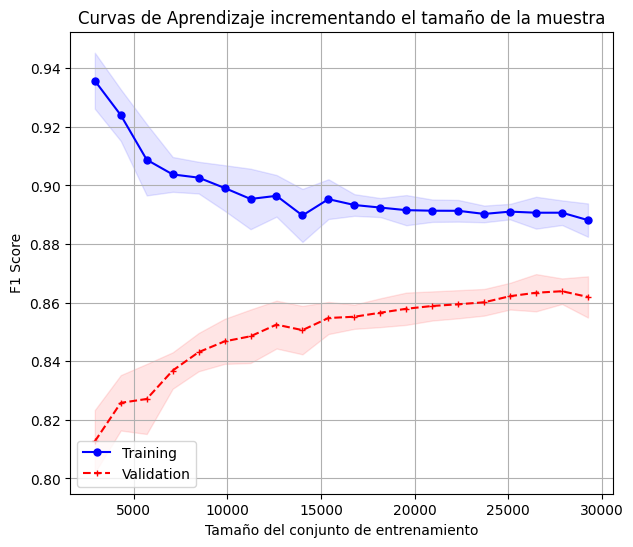

In [ ]:

print('Curvas de aprendizaje del modelo árbol de decisión:')
mi_ModeloYCurvas(X_train)


Finalmente, voy a graficar el árbol

In [ ]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image

# Definir y ajustar el modelo
modelo = DecisionTreeClassifier( ccp_alpha = 0.00, class_weight = 'balanced', criterion = 'entropy', max_depth = 10, min_samples_split = 2)

X_transformed = col_trans.fit_transform(X_train)

clf = modelo.fit(X_transformed, y_train)

# Asegúrate de pasar todos los nombres de clase
names = ["S", "M", "L", "XL"]

# Exportar el árbol de decisión
dot_data = export_graphviz(
    decision_tree=clf,
    out_file=None,
    max_depth=None,
    feature_names=list(pd.DataFrame(X_train).columns.values),  # Asegúrate de que coincidan los nombres después de la transformación
    class_names=names,  # Asegúrate de incluir todas las clases
    filled=True,
    rotate=True,
    proportion=False
)

# Crear el gráfico
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.697823 to fit



Evaluación de las métricas del modelo con el set de entrenamiento y prueba luego del ajuste.

In [ ]:



# Entrenar el modelo

X_transformed = col_trans.fit_transform(X_train)

modelo.fit(X_transformed, y_train)

# Predecir en el conjunto de entrenamiento y prueba
y_train_pred = modelo.predict(X_transformed)
y_test_pred = modelo.predict(col_trans.fit_transform(X_test) )

# Calcular las métricas
print("Entrenamiento:")
print(classification_report(y_train, y_train_pred))
print("Prueba:")
print(classification_report(y_test, y_test_pred))

"""
# Matriz de confusión
print("Matriz de confusión (Entrenamiento):")
print(confusion_matrix(y_train, y_train_pred))
print("Matriz de confusión (Prueba):")
print(confusion_matrix(y_test, y_test_pred))
"""

Entrenamiento:
              precision    recall  f1-score   support

           L       0.90      0.84      0.87      9127
           M       0.83      0.88      0.85      9230
           S       0.94      0.91      0.92      9102
          XL       0.91      0.93      0.92      9119

    accuracy                           0.89     36578
   macro avg       0.89      0.89      0.89     36578
weighted avg       0.89      0.89      0.89     36578

Prueba:
              precision    recall  f1-score   support

           L       0.78      0.60      0.68      1632
           M       0.60      0.68      0.64      1528
           S       0.76      0.94      0.84      1657
          XL       0.84      0.73      0.78      1638

    accuracy                           0.74      6455
   macro avg       0.75      0.74      0.74      6455
weighted avg       0.75      0.74      0.74      6455



'\n# Matriz de confusión\nprint("Matriz de confusión (Entrenamiento):")\nprint(confusion_matrix(y_train, y_train_pred))\nprint("Matriz de confusión (Prueba):")\nprint(confusion_matrix(y_test, y_test_pred))\n'

In [ ]:
# Crear una función para graficar la matriz de confusión
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicciones')
    plt.ylabel('Valores reales')
    plt.title(title)
    plt.show()

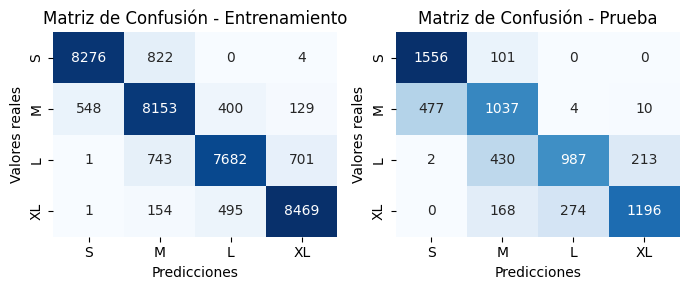

In [ ]:
# Definir las clases
class_names = ['S', 'M', 'L', 'XL']  # Cambia según tus clases

# Función para graficar la matriz de confusión con etiquetas
def plot_confusion_matrix(ax, y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred, labels=class_names)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax,
                xticklabels=class_names, yticklabels=class_names)
    ax.set_xlabel('Predicciones')
    ax.set_ylabel('Valores reales')
    ax.set_title(title)

# Crear las subplots para mostrar las dos gráficas lado a lado
fig, axes = plt.subplots(1, 2, figsize=(7, 3))

# Graficar la matriz de confusión para el conjunto de entrenamiento
plot_confusion_matrix(axes[0], y_train, y_train_pred, 'Matriz de Confusión - Entrenamiento')

# Graficar la matriz de confusión para el conjunto de prueba
plot_confusion_matrix(axes[1], y_test, y_test_pred, 'Matriz de Confusión - Prueba')

# Mostrar las gráficas
plt.tight_layout()
plt.show()

Análisis de la importancia de las variables de entrada en la variación observada del árbol de decisión.

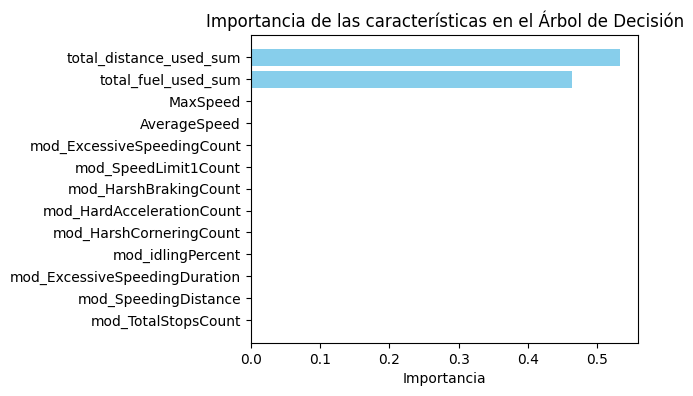

In [ ]:


# Extraer la importancia de las características del modelo de árbol
feature_importances = modelo.feature_importances_

# Crear un DataFrame para organizar las características y su importancia
feature_names = X_train.columns  # Nombres de las columnas (características)
importance_df = pd.DataFrame({
    'Característica': feature_names,
    'Importancia': feature_importances
})

# Ordenar las características por importancia
importance_df = importance_df.sort_values(by='Importancia', ascending=False)

# Graficar las características más importantes
plt.figure(figsize=(5, 4))
plt.barh(importance_df['Característica'], importance_df['Importancia'], color='skyblue')
plt.xlabel('Importancia')
plt.title('Importancia de las características en el Árbol de Decisión')
plt.gca().invert_yaxis()  # Invertir el eje Y para que las características más importantes aparezcan arriba
plt.show()


El análisis de feature importance muestra que casi toda la variación es explicada por la distancia total y la cantidad total del combustible consumido. Sin embargo, al ser conmsuption una variable calculada a partir de dos variables independientes, entonces voy a quitar total_distance_used_sum y total_fuel_used_sum. Con esto voy a correr nuevamente el modelo.

##**Conclusión final comparando los dos modelos Decision Tree y XGBoost**

- En este notebook ejecutamos el refinamiento del decision tree. Al final fueron probados diferentes cambios:
1. Disminución de variabibles.
2. Discretización de dichas variables, como por ejemplo, expresar la cantidad de veces que un conductor excede la velocidad en grupos S, M, L y XL.

El resultado muestra que siempre total distance y total fuel consumed son los dos factores más importantes para predecir el rendimiento. Se obtruvo  al final un f1 scroe con los datos de prueba de 74%. Esto implicó un árbol de profundidad 10, muy profundo. Cuando se hace feature importance analysis se llega a la conclusión que los demás factores aparte de Distancia total y consumo total no tienen nada de relevancia.

- En el otro notebook se usó un modelo XGBoost, se llega a un F1 score de 94% e igualmente el feature analysis muestra como principales a la distancia total y al consumo total de combustible. Tiene una ventaja y es que con sólo 5 niveles es capaz de hacer la predicción.

**Conclusión final: Vamos a usar el modelo XGBoost como modelo final.**